WEEK 1: DATA-PREPROCESSING AND IMAGE MASKING

In [ ]:
##WEEK-1

import os
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from torchvision.models.segmentation import deeplabv3_resnet50
import torch.nn as nn
from PIL import Image

# === GOOGLE DRIVE MOUNTING (Required for path access) ===
# NOTE: Run this cell first, and follow the prompt to connect your Google Drive.
from google.colab import drive
drive.mount('/content/drive')

# ============================ 1. CONFIGURATION ============================
# IMPORTANT: Verify these paths match your Google Drive structure.
MODEL_PATH = "/content/drive/MyDrive/AI/best_deeplabv3_finetuned.pth"
IMAGE_FOLDER_PATH = "/content/drive/MyDrive/AI/image.zip" # Path to the FOLDER with your test images

NUM_CLASSES = 2
LONG_SIDE_SIZE = 256
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
import torch
import torch.nn as nn
from torchvision.models.segmentation import deeplabv3_resnet50

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
NUM_CLASSES = 2

# 1. Define model
model = deeplabv3_resnet50(weights=None, aux_loss=True)
model.classifier[4] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
model.aux_classifier[4] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
model.to(DEVICE)

# 2. Train your model here
# (training loop code must go here... optimizer, loss, dataloader, epochs, etc.)

# 3. Save weights after training
torch.save(model.state_dict(), "best_deeplabv3_finetuned.pth")

# Optional: save full model (not recommended unless you know why)
# torch.save(model, "best_deeplabv3_finetuned_full.pth")


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 186MB/s]


loading annotations into memory...
Done (t=0.54s)
creating index...
index created!


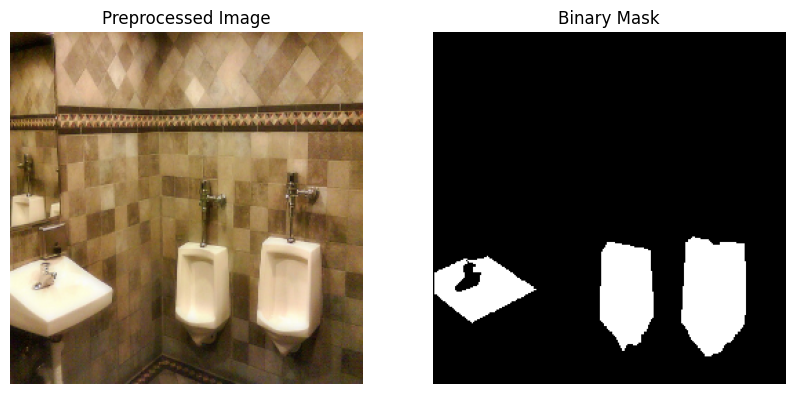

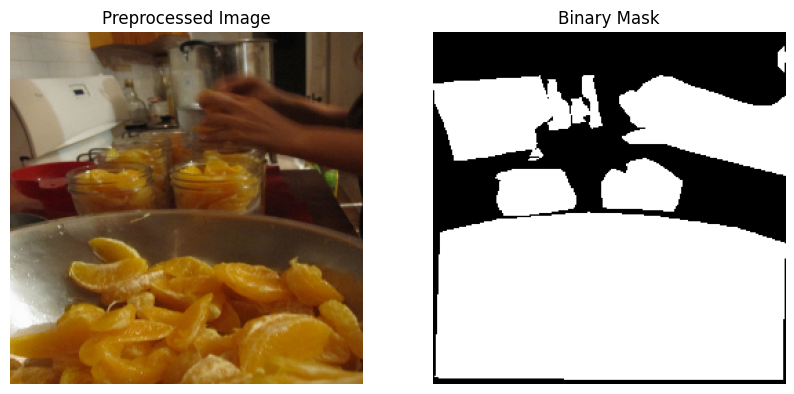

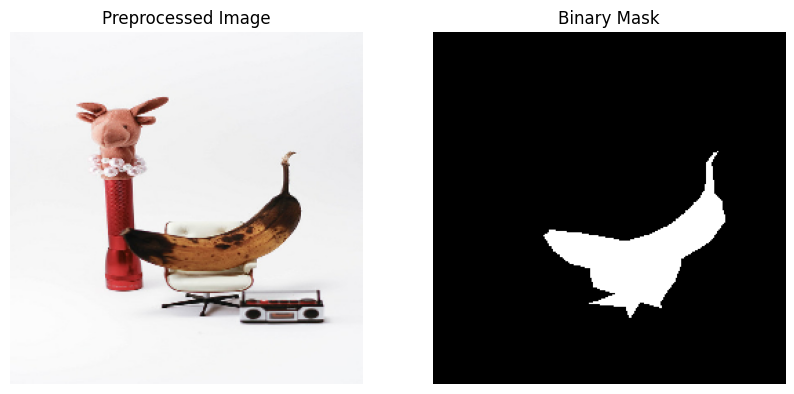

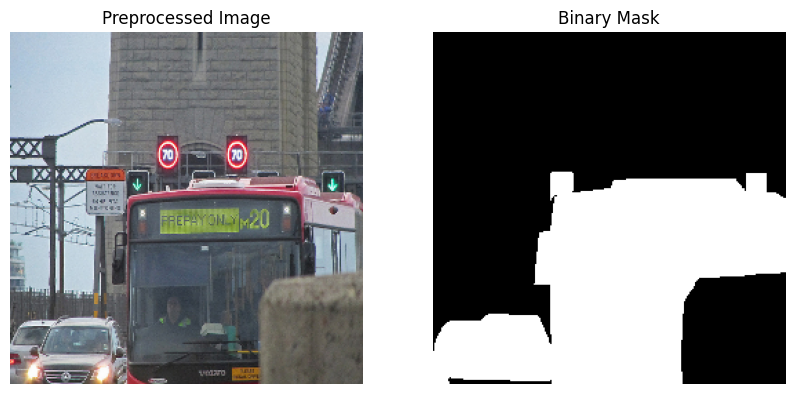

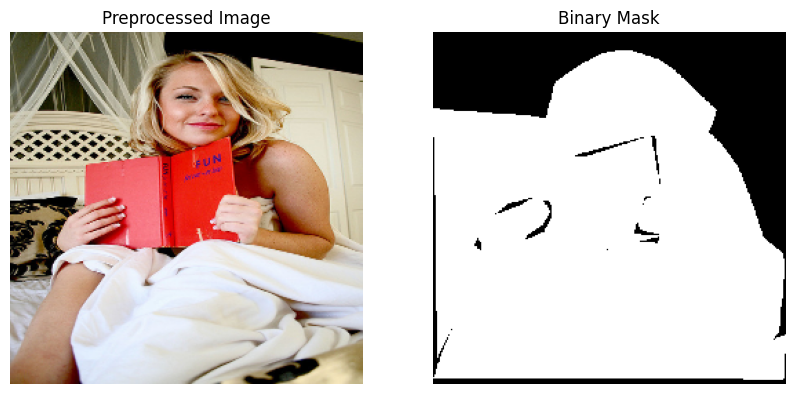

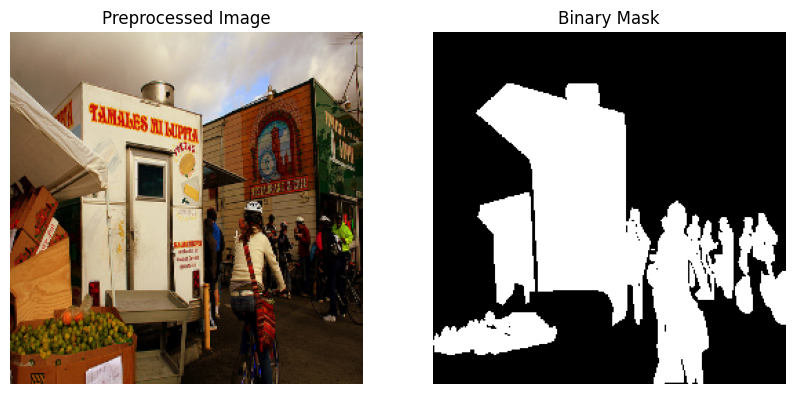

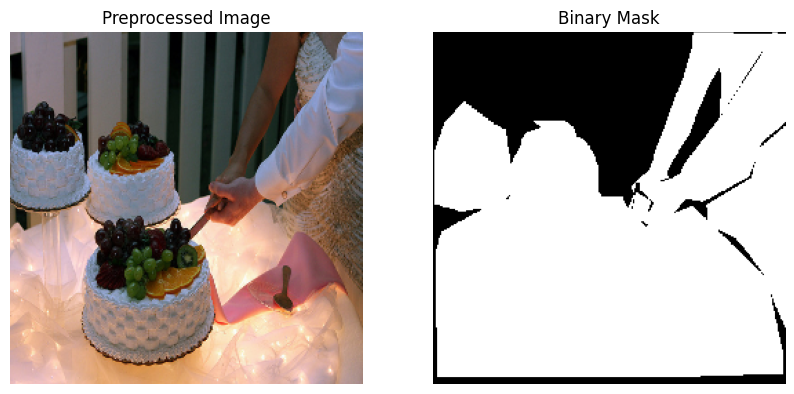

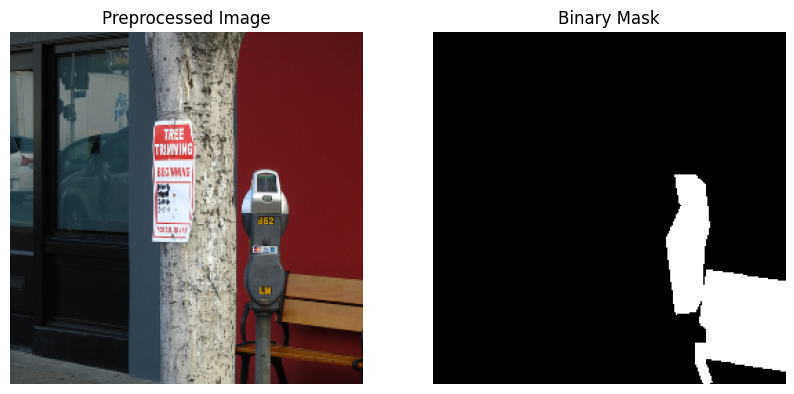

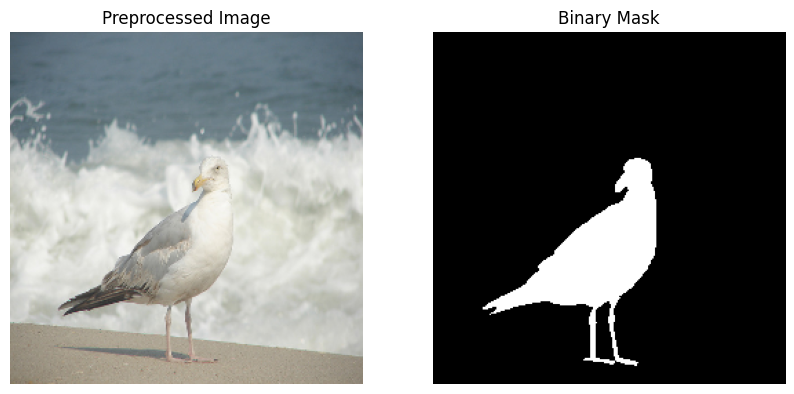

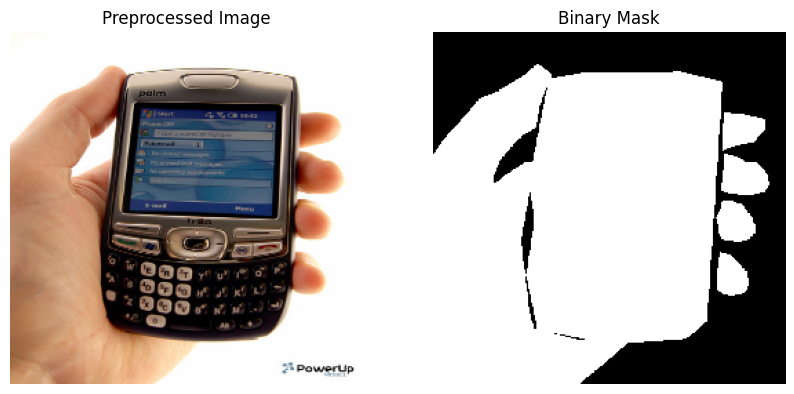

In [ ]:
import os
import random
import numpy as np
import cv2
from pycocotools.coco import COCO
import matplotlib.pyplot as plt

# ==========================
# Step 1: Paths
# ==========================
data_dir = r"/content/coco_dataset"   # <-- update if needed
ann_file = os.path.join(data_dir, "annotations", "instances_val2017.json")
img_dir = os.path.join(data_dir, "val2017")

# Load COCO annotations
coco = COCO(ann_file)

# ==========================
# Step 2: Preprocessing function
# ==========================
def preprocess_image_and_mask(img_id, target_size=(256, 256)):
    """Load image and mask, then preprocess: resize, normalize (/250), binary mask."""

    # Get image info
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(img_dir, img_info['file_name'])

    # Load image (BGR → RGB)
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Load annotations for this image
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)

    # Build combined mask (union of all objects)
    mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
    for ann in anns:
        mask = np.maximum(mask, coco.annToMask(ann))

    # Convert to binary mask (subject=1, background=0)
    binary_mask = (mask > 0).astype(np.uint8)

    # Resize image and mask
    image_resized = cv2.resize(image, target_size, interpolation=cv2.INTER_LINEAR)
    mask_resized = cv2.resize(binary_mask, target_size, interpolation=cv2.INTER_NEAREST)

    # Normalize image (divide each pixel by 250 instead of 255)
    image_resized = image_resized.astype(np.float32) / 256.0

    return image_resized, mask_resized

# ==========================
# Step 3: Visualization function
# ==========================
def show_preprocessed_examples(num_examples=3):
    """Display a few preprocessed images and their binary masks."""
    img_ids = random.sample(coco.getImgIds(), num_examples)

    for img_id in img_ids:
        image, mask = preprocess_image_and_mask(img_id)

        plt.figure(figsize=(10, 5))

        # Show image
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.axis('off')
        plt.title("Preprocessed Image")

        # Show binary mask
        plt.subplot(1, 2, 2)
        plt.imshow(mask, cmap="gray")
        plt.axis('off')
        plt.title("Binary Mask")

        plt.show()

# ==========================
# Step 4: Run demo
# ==========================
show_preprocessed_examples(num_examples=10)  # show 5 random samples


WEEK-2 IMAGE SEGMENTAION

loading annotations into memory...
Done (t=0.85s)
creating index...
index created!
Main subject: person | Category ID: 1


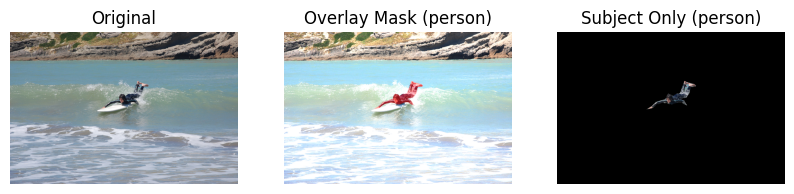

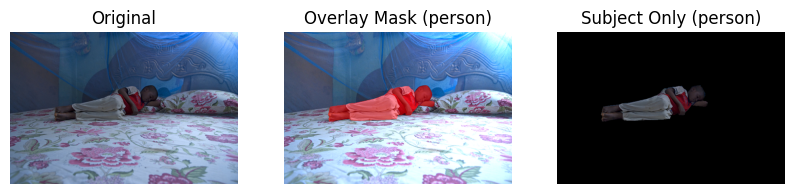

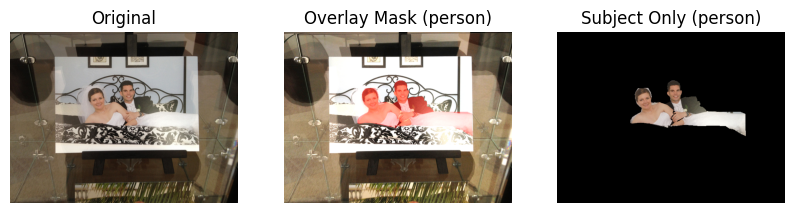

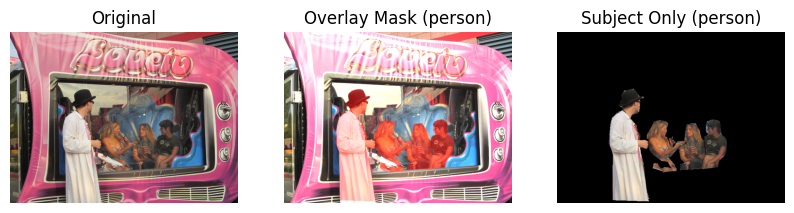

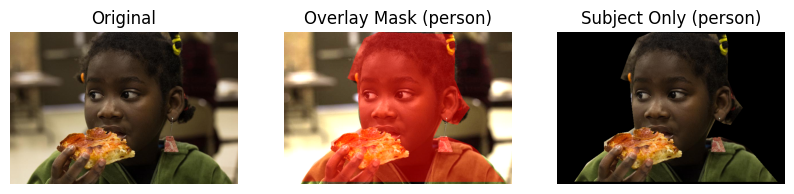

 No 'person' found in image: 000000228144.jpg


In [ ]:
## WEEK-2

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pycocotools.coco import COCO

# ==== STEP 1: Setup Paths ====
ANN_FILE = "/content/coco_dataset/annotations/instances_val2017.json"
IMAGES_DIR = "/content/coco_dataset/val2017"
coco = COCO(ANN_FILE)

# ==== STEP 2: Pick main subject ====
main_subject_name = "person"   # change to 'dog', 'car', etc.
main_subject_cat_id = coco.getCatIds(catNms=[main_subject_name])[0]
print("Main subject:", main_subject_name, "| Category ID:", main_subject_cat_id)

# ==== STEP 3: Build binary mask for the chosen subject ====
def build_binary_mask_main_subject(coco, img_info, main_category_name="person"):
    cat_ids = coco.getCatIds(catNms=[main_category_name])
    ann_ids = coco.getAnnIds(imgIds=img_info['id'], catIds=cat_ids, iscrowd=False)
    anns = coco.loadAnns(ann_ids)

    mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
    for ann in anns:
        mask = np.maximum(mask, coco.annToMask(ann))

    return (mask > 0).astype(np.uint8)

# ==== STEP 4: Get images 10–15 (different set) ====
img_ids = coco.getImgIds()[92:98]   # images from index 10 to 14

for img_id in img_ids:
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(IMAGES_DIR, img_info['file_name'])

    if not os.path.exists(img_path):
        print(f" Image not found: {img_path}")
        continue

    image = cv2.imread(img_path)
    if image is None:
        print(f" Failed to load image: {img_path}")
        continue
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    mask = build_binary_mask_main_subject(coco, img_info, main_category_name=main_subject_name)

    if mask.sum() == 0:
        print(f" No '{main_subject_name}' found in image: {img_info['file_name']}")
        continue

    # Overlay mask
    overlay = image.copy()
    overlay[mask == 1] = [255, 0, 0]
    overlayed = cv2.addWeighted(image, 1, overlay, 0.5, 0)

    # Subject only
    subject_only = image.copy()
    subject_only[mask == 0] = 0

    # Display results
    plt.figure(figsize=(10,6))

    plt.subplot(1,3,1)
    plt.imshow(image)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(overlayed)
    plt.title(f"Overlay Mask ({main_subject_name})")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(subject_only)
    plt.title(f"Subject Only ({main_subject_name})")
    plt.axis("off")

    plt.show()


WEEK-3 MODEL TRAINING

TensorFlow version: 2.19.0
--2025-10-03 09:26:44--  http://images.cocodataset.org/zips/val2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.216.209.169, 52.217.198.1, 52.217.169.9, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|52.216.209.169|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 815585330 (778M) [application/zip]
Saving to: ‘val2017.zip’

val2017.zip         100%[===================>] 777.80M  40.5MB/s    in 19s     

2025-10-03 09:27:03 (40.8 MB/s) - ‘val2017.zip’ saved [815585330/815585330]

--2025-10-03 09:27:03--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 3.5.24.90, 54.231.203.1, 52.217.192.65, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.24.90|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘annotations_trainval2017.zip’


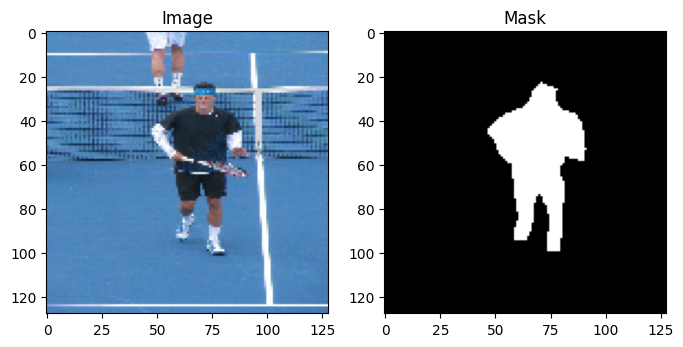

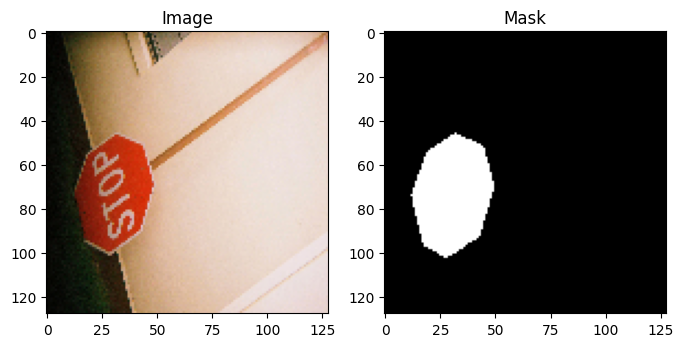

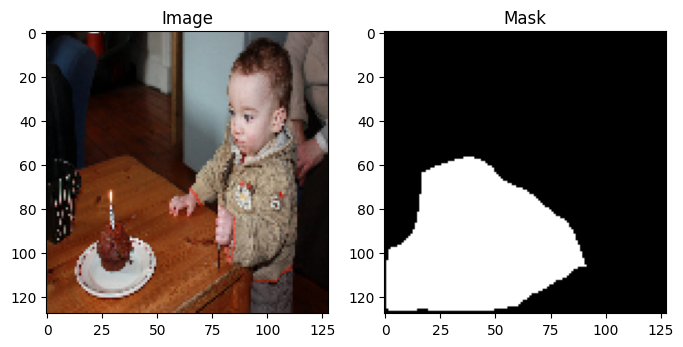

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │        448 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │      2,320 │ conv2d[0][0]      │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │      4,640 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │      9,248 │ conv2d_2[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │     18,496 │ max_pooling2d_1[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 32, 32,    │     36,928 │ conv2d_4[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 16, 16,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 16, 16,    │     73,856 │ max_pooling2d_2[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 16, 16,    │    147,584 │ conv2d_6[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 32, 32,    │          0 │ conv2d_7[0][0]    │
│ (UpSampling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 32, 32,    │          0 │ up_sampling2d[0]… │
│ (Concatenate)       │ 192)              │            │ conv2d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 32, 32,    │    110,656 │ concatenate[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 32, 32,    │     36,928 │ conv2d_8[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_1     │ (None, 64, 64,    │          0 │ conv2d_9[0][0]  

 Total params: 487,297 (1.86 MB)

 Trainable params: 487,297 (1.86 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/30
28/30 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.7184 - loss: 1.3558

30/30 ━━━━━━━━━━━━━━━━━━━━ 33s 278ms/step - accuracy: 0.7255 - loss: 1.3535 - val_accuracy: 0.8059 - val_loss: 1.3332
Epoch 2/30
28/30 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8146 - loss: 1.2762

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - accuracy: 0.8139 - loss: 1.2754 - val_accuracy: 0.8059 - val_loss: 1.2584
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.8021 - loss: 1.2941

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.8023 - loss: 1.2939 - val_accuracy: 0.8059 - val_loss: 1.2575
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8150 - loss: 1.2546 - val_accuracy: 0.8059 - val_loss: 1.3281
Epoch 5/30
28/30 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.7997 - loss: 1.2803

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - accuracy: 0.8003 - loss: 1.2761 - val_accuracy: 0.7515 - val_loss: 1.2088
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.7698 - loss: 1.2356 - val_accuracy: 0.7700 - val_loss: 1.2206
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.7819 - loss: 1.2066 - val_accuracy: 0.7209 - val_loss: 1.2311
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.7656 - loss: 1.1875 - val_accuracy: 0.7537 - val_loss: 1.2142
Epoch 9/30
28/30 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.7584 - loss: 1.1818

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - accuracy: 0.7589 - loss: 1.1814 - val_accuracy: 0.7906 - val_loss: 1.1998
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.7769 - loss: 1.1625 - val_accuracy: 0.7969 - val_loss: 1.2000
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.7702 - loss: 1.1744 - val_accuracy: 0.7809 - val_loss: 1.2065
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.7653 - loss: 1.1805

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - accuracy: 0.7657 - loss: 1.1800 - val_accuracy: 0.7968 - val_loss: 1.1869
Epoch 13/30
28/30 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.7777 - loss: 1.1542

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.7774 - loss: 1.1527 - val_accuracy: 0.7771 - val_loss: 1.1651
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.7679 - loss: 1.1121 - val_accuracy: 0.7557 - val_loss: 1.1654
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.7706 - loss: 1.1534 - val_accuracy: 0.7295 - val_loss: 1.1652
Epoch 16/30
28/30 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.7515 - loss: 1.1463

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.7527 - loss: 1.1445 - val_accuracy: 0.7566 - val_loss: 1.1650
Epoch 17/30
28/30 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.7545 - loss: 1.1591

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - accuracy: 0.7568 - loss: 1.1577 - val_accuracy: 0.7764 - val_loss: 1.1540
Epoch 18/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.7509 - loss: 1.1481 - val_accuracy: 0.7833 - val_loss: 1.1768
Epoch 19/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.7505 - loss: 1.1610

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.7512 - loss: 1.1601 - val_accuracy: 0.7882 - val_loss: 1.1527
Epoch 20/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.8030 - loss: 1.1356 - val_accuracy: 0.7355 - val_loss: 1.1607
Epoch 21/30
29/30 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.7687 - loss: 1.1420

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.7687 - loss: 1.1415 - val_accuracy: 0.7814 - val_loss: 1.1483
Epoch 22/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.7914 - loss: 1.0856 - val_accuracy: 0.7836 - val_loss: 1.1604
Epoch 23/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.7742 - loss: 1.1447

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.7740 - loss: 1.1439 - val_accuracy: 0.7707 - val_loss: 1.1416
Epoch 24/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.7980 - loss: 1.0822 - val_accuracy: 0.7705 - val_loss: 1.1579
Epoch 25/30
28/30 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.7743 - loss: 1.1484

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.7750 - loss: 1.1487 - val_accuracy: 0.7871 - val_loss: 1.1351
Epoch 26/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.7940 - loss: 1.0521 - val_accuracy: 0.7658 - val_loss: 1.1429
Epoch 27/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.7737 - loss: 1.1098 - val_accuracy: 0.7867 - val_loss: 1.1442
Epoch 28/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.7694 - loss: 1.1149 - val_accuracy: 0.7844 - val_loss: 1.1547
Epoch 29/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.7713 - loss: 1.0895 - val_accuracy: 0.7304 - val_loss: 1.1365
Epoch 30/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.7760 - loss: 1.0643 - val_accuracy: 0.7637 - val_loss: 1.1385


In [ ]:
## UNET-MODEL TRAINING
## WEEK-3
# ==========================
# Step 0: Setup in Colab
# ==========================
!pip install pycocotools opencv-python scikit-learn

import os
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models

print("TensorFlow version:", tf.__version__)

# ==========================
# Step 1: Download COCO val2017
# ==========================
!wget http://images.cocodataset.org/zips/val2017.zip
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip
!unzip -q val2017.zip
!unzip -q annotations_trainval2017.zip

data_dir = "./"
ann_file = os.path.join(data_dir, "annotations", "instances_val2017.json")
img_dir = os.path.join(data_dir, "val2017")

coco = COCO(ann_file)

# ==========================
# Step 2: Preprocessing function
# ==========================
def preprocess_image_and_mask(img_id, target_size=(128, 128)):
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(img_dir, img_info['file_name'])

    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)

    if len(anns) == 0:
        mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
    else:
        # Take largest object
        largest_ann = max(anns, key=lambda x: x['area'])
        mask = coco.annToMask(largest_ann)

    # Resize
    image_resized = cv2.resize(image, target_size, interpolation=cv2.INTER_LINEAR)
    mask_resized = cv2.resize(mask, target_size, interpolation=cv2.INTER_NEAREST)

    # Normalize image
    image_resized = image_resized.astype(np.float32) / 255.0
    mask_resized = mask_resized.astype(np.float32)

    return image_resized, mask_resized

# ==========================
# Step 3: Build dataset
# ==========================
X, y = [], []
img_ids = coco.getImgIds()

for img_id in img_ids[:300]:  # take 300 images for demo
    image, mask = preprocess_image_and_mask(img_id)
    X.append(image)
    y.append(mask)

X = np.array(X, dtype=np.float32)
y = np.expand_dims(np.array(y, dtype=np.float32), axis=-1)

print("Dataset built:", X.shape, y.shape)

# Visualize some samples
for i in range(3):
    idx = random.randint(0, len(X)-1)
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1); plt.imshow(X[idx]); plt.title("Image")
    plt.subplot(1,2,2); plt.imshow(y[idx].squeeze(), cmap="gray"); plt.title("Mask")
    plt.show()

# Train-val split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# ==========================
# Step 4: Build U-Net
# ==========================
def build_unet(input_shape=(128, 128, 3)):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    c1 = layers.Conv2D(16, 3, activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(16, 3, activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(32, 3, activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(32, 3, activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = layers.Conv2D(64, 3, activation='relu', padding='same')(p2)
    c3 = layers.Conv2D(64, 3, activation='relu', padding='same')(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    # Bottleneck
    c4 = layers.Conv2D(128, 3, activation='relu', padding='same')(p3)
    c4 = layers.Conv2D(128, 3, activation='relu', padding='same')(c4)

    # Decoder
    u5 = layers.UpSampling2D((2, 2))(c4)
    u5 = layers.Concatenate()([u5, c3])
    c5 = layers.Conv2D(64, 3, activation='relu', padding='same')(u5)
    c5 = layers.Conv2D(64, 3, activation='relu', padding='same')(c5)

    u6 = layers.UpSampling2D((2, 2))(c5)
    u6 = layers.Concatenate()([u6, c2])
    c6 = layers.Conv2D(32, 3, activation='relu', padding='same')(u6)
    c6 = layers.Conv2D(32, 3, activation='relu', padding='same')(c6)

    u7 = layers.UpSampling2D((2, 2))(c6)
    u7 = layers.Concatenate()([u7, c1])
    c7 = layers.Conv2D(16, 3, activation='relu', padding='same')(u7)
    c7 = layers.Conv2D(16, 3, activation='relu', padding='same')(c7)

    outputs = layers.Conv2D(1, 1, activation='sigmoid')(c7)

    return models.Model(inputs, outputs)

# ==========================
# Step 5: Compile model with BCE + Dice Loss
# ==========================
def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def bce_dice_loss(y_true, y_pred):
    bce = tf.keras.losses.BinaryCrossentropy()(y_true, y_pred)
    return bce + dice_loss(y_true, y_pred)

model = build_unet((128, 128, 3))
model.compile(optimizer='adam', loss=bce_dice_loss, metrics=['accuracy'])
model.summary()

# ==========================
# Step 6: Train with checkpoints
# ==========================
callbacks = [
    tf.keras.callbacks.ModelCheckpoint("best_model.h5", save_best_only=True, monitor="val_loss"),
    tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)
]

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=30,   # train longer
    batch_size=8,
    callbacks=callbacks
)



loading annotations into memory...
Done (t=2.22s)
creating index...
index created!


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


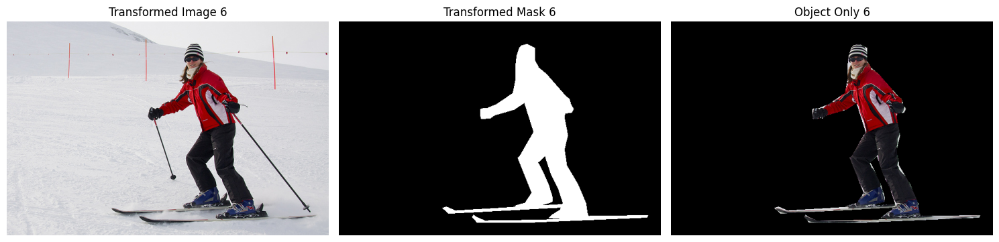

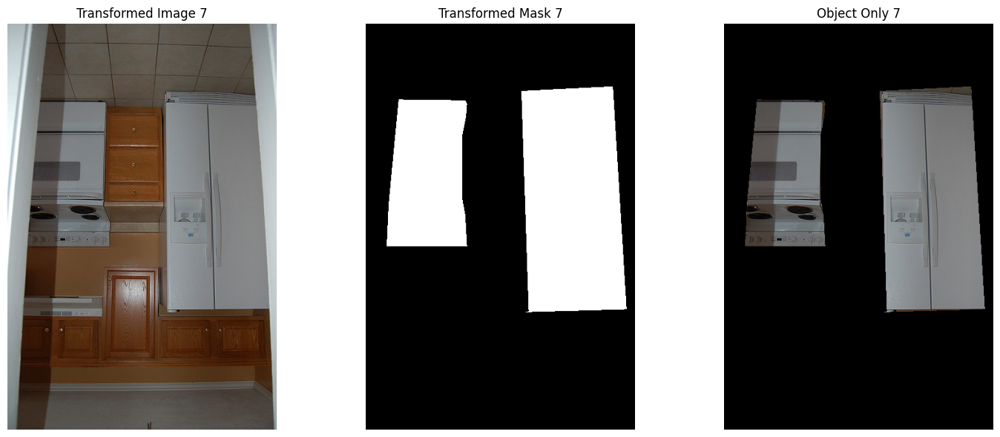

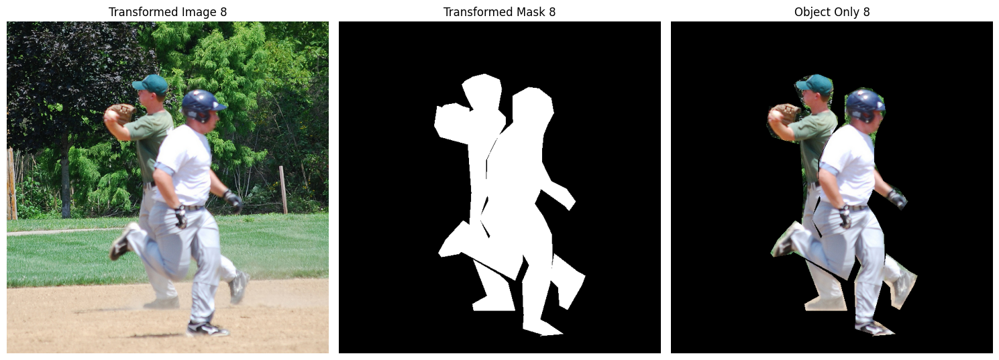

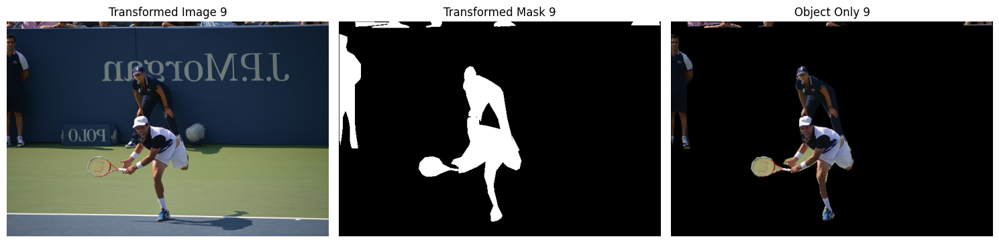

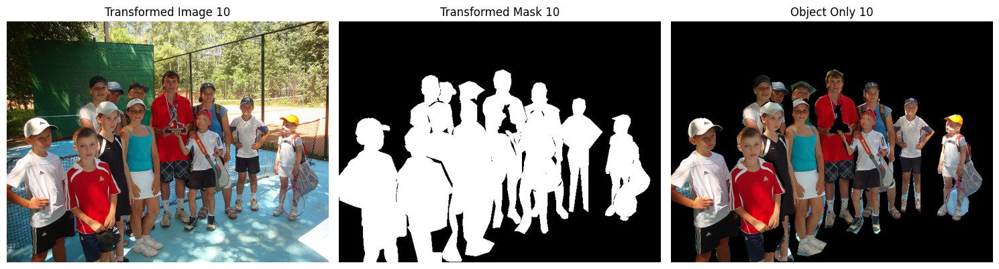

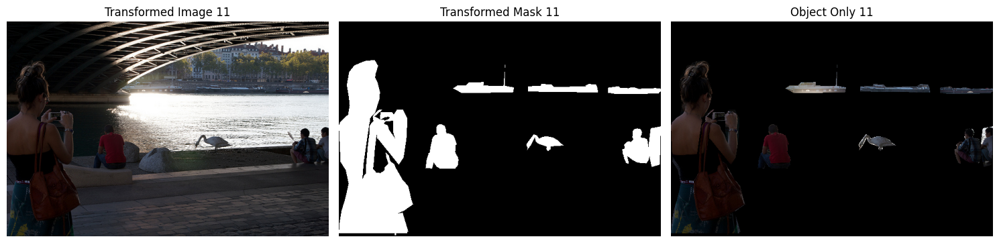

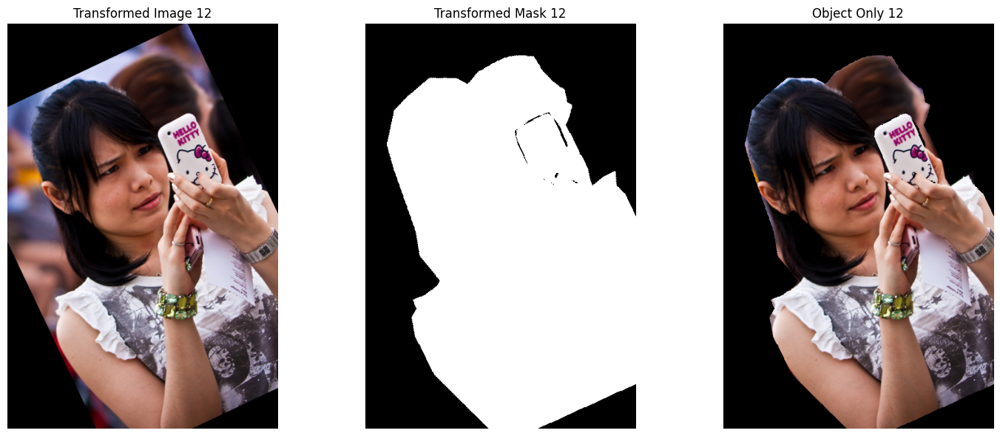

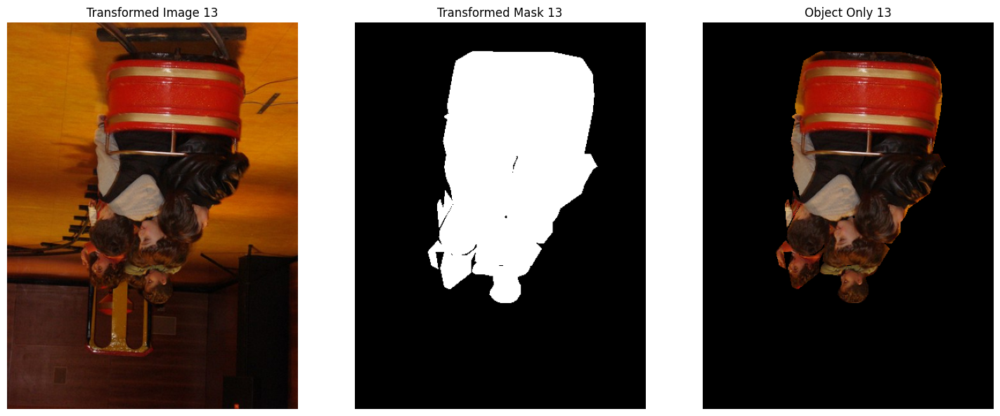

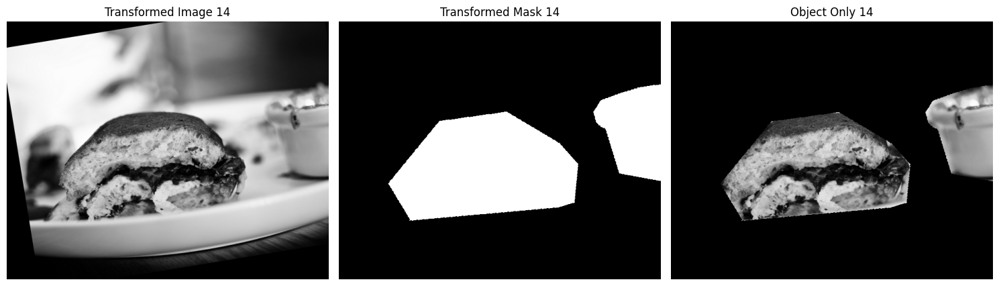

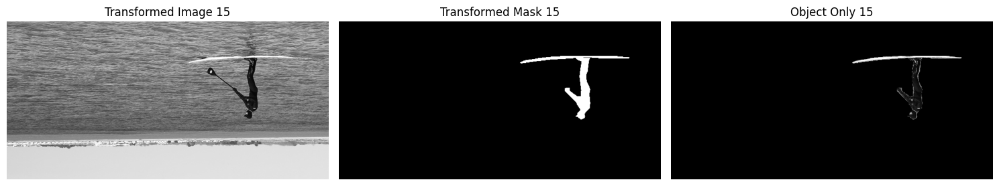

In [ ]:

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import albumentations as A
from pycocotools.coco import COCO

# ==========================
# COCO paths
# ==========================
data_dir = "./"
ann_file = os.path.join(data_dir, "annotations", "instances_val2017.json")
img_dir = os.path.join(data_dir, "val2017")

coco = COCO(ann_file)

# ==========================
# Albumentations pipeline
# ==========================
augmenter = A.OneOf([
    A.HorizontalFlip(p=1.0),
    A.VerticalFlip(p=1.0),
    A.RandomRotate90(p=1.0),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=30, p=1.0)
], p=1.0)

# ==========================
# Select images 6–15
# ==========================
img_ids = sorted(coco.getImgIds())
for count, img_id in enumerate(img_ids[5:15], start=6):  # 6th to 15th
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(img_dir, img_info["file_name"])

    # Load original image in high resolution
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Build mask from annotations
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)
    mask = np.zeros((img.shape[0], img.shape[1]), dtype=np.uint8)
    for ann in anns:
        mask = np.maximum(mask, coco.annToMask(ann))

    # Apply augmentation (flip/rotate) to both image & mask
    transformed = augmenter(image=img, mask=mask)
    aug_img, aug_mask = transformed["image"], transformed["mask"]

    # Object-only view
    obj_only = aug_img * np.expand_dims(aug_mask, axis=-1)

    # ==========================
    # Plot (clear high-res)
    # ==========================
    fig, axes = plt.subplots(1, 3, figsize=(15, 6))
    titles = [f"Transformed Image {count}", f"Transformed Mask {count}", f"Object Only {count}"]
    data = [aug_img, aug_mask, obj_only]
    cmaps = [None, "gray", None]

    for ax, d, title, cmap in zip(axes, data, titles, cmaps):
        ax.imshow(d, cmap=cmap)
        ax.set_title(title)
        ax.axis("off")

    plt.tight_layout()
    plt.show()


WEEK-4 HYPERPARAMETER-TUNING AND MODEL EVALUATION

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models, backend as K
from sklearn.model_selection import train_test_split
import numpy as np
import time
import random
import matplotlib.pyplot as plt

# =========================
# IoU Metric
# =========================
def iou_metric(y_true, y_pred, smooth=1e-6):
    y_pred = K.cast(y_pred > 0.5, 'float32')
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

# =========================
# Build U-Net Model
# =========================
def build_unet(input_shape=(128, 128, 3)):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    c1 = layers.Conv2D(16, 3, activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(16, 3, activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(32, 3, activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(32, 3, activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = layers.Conv2D(64, 3, activation='relu', padding='same')(p2)
    c3 = layers.Conv2D(64, 3, activation='relu', padding='same')(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    # Bottleneck
    c4 = layers.Conv2D(128, 3, activation='relu', padding='same')(p3)
    c4 = layers.Conv2D(128, 3, activation='relu', padding='same')(c4)

    # Decoder
    u5 = layers.UpSampling2D((2, 2))(c4)
    u5 = layers.Concatenate()([u5, c3])
    c5 = layers.Conv2D(64, 3, activation='relu', padding='same')(u5)
    c5 = layers.Conv2D(64, 3, activation='relu', padding='same')(c5)

    u6 = layers.UpSampling2D((2, 2))(c5)
    u6 = layers.Concatenate()([u6, c2])
    c6 = layers.Conv2D(32, 3, activation='relu', padding='same')(u6)
    c6 = layers.Conv2D(32, 3, activation='relu', padding='same')(c6)

    u7 = layers.UpSampling2D((2, 2))(c6)
    u7 = layers.Concatenate()([u7, c1])
    c7 = layers.Conv2D(16, 3, activation='relu', padding='same')(u7)
    c7 = layers.Conv2D(16, 3, activation='relu', padding='same')(c7)

    outputs = layers.Conv2D(1, 1, activation='sigmoid')(c7)
    return models.Model(inputs, outputs)

# =========================
# Dice + BCE Loss
# =========================
def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def bce_dice_loss(y_true, y_pred):
    bce = tf.keras.losses.BinaryCrossentropy()(y_true, y_pred)
    return bce + dice_loss(y_true, y_pred)

# =========================
# Custom Progress Logger
# =========================
class ProgressLogger(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.start_time = time.time()

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        elapsed = time.time() - self.start_time

        train_loss = logs.get('loss', 0)
        val_loss = logs.get('val_loss', 0)

        # Safely get metric keys (Keras may append _1)
        train_iou = logs.get('iou_metric', 0) or logs.get('iou_metric_1', 0)
        val_iou = logs.get('val_iou_metric', 0) or logs.get('val_iou_metric_1', 0)

        print(f"Epoch {epoch+1}/{self.params['epochs']}")
        print(f"[Train]: 100% | Train Loss: {train_loss:.4f}, "
              f"Train IoU: {train_iou:.4f} | "
              f"Val Loss: {val_loss:.4f}, "
              f"Val IoU: {val_iou:.4f} | "
              f"Time: {elapsed/60:.2f} min")

# =========================
# Build & Compile Model
# =========================
model = build_unet((128,128,3))
model.compile(optimizer='adam', loss=bce_dice_loss, metrics=[iou_metric])
model.summary()

# =========================
# Train Model
# =========================
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=10,            # you can increase later
    batch_size=8,
    verbose=0,            # disable default bar
    callbacks=[ProgressLogger()]
)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_15 (Conv2D)  │ (None, 128, 128,  │        448 │ input_layer_1[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_16 (Conv2D)  │ (None, 128, 128,  │      2,320 │ conv2d_15[0][0]   │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 64, 64,    │          0 │ conv2d_16[0][0]   │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_17 (Conv2D)  │ (None, 64, 64,    │      4,640 │ max_pooling2d_3[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_18 (Conv2D)  │ (None, 64, 64,    │      9,248 │ conv2d_17[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 32, 32,    │          0 │ conv2d_18[0][0]   │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 32, 32,    │     18,496 │ max_pooling2d_4[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 32, 32,    │     36,928 │ conv2d_19[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 16, 16,    │          0 │ conv2d_20[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 16, 16,    │     73,856 │ max_pooling2d_5[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 16, 16,    │    147,584 │ conv2d_21[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_3     │ (None, 32, 32,    │          0 │ conv2d_22[0][0]   │
│ (UpSampling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 32, 32,    │          0 │ up_sampling2d_3[… │
│ (Concatenate)       │ 192)              │            │ conv2d_20[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 32, 32,    │    110,656 │ concatenate_3[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_24 (Conv2D)  │ (None, 32, 32,    │     36,928 │ conv2d_23[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_4     │ (None, 64, 64,    │          0 │ conv2d_24[0][0] 

 Total params: 487,297 (1.86 MB)

 Trainable params: 487,297 (1.86 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
[Train]: 100% | Train Loss: 1.3066, Train IoU: 0.0000 | Val Loss: 1.2724, Val IoU: 0.0000 | Time: 0.38 min
Epoch 2/10
[Train]: 100% | Train Loss: 1.2558, Train IoU: 0.0000 | Val Loss: 1.2391, Val IoU: 0.0000 | Time: 0.53 min
Epoch 3/10
[Train]: 100% | Train Loss: 1.2450, Train IoU: 0.0000 | Val Loss: 1.2455, Val IoU: 0.0000 | Time: 0.55 min
Epoch 4/10
[Train]: 100% | Train Loss: 1.2570, Train IoU: 0.0000 | Val Loss: 1.2622, Val IoU: 0.0000 | Time: 0.57 min
Epoch 5/10
[Train]: 100% | Train Loss: 1.2208, Train IoU: 0.0000 | Val Loss: 1.5893, Val IoU: 0.0000 | Time: 0.58 min
Epoch 6/10
[Train]: 100% | Train Loss: 1.2308, Train IoU: 0.0000 | Val Loss: 1.2381, Val IoU: 0.0000 | Time: 0.60 min
Epoch 7/10
[Train]: 100% | Train Loss: 1.1935, Train IoU: 0.0457 | Val Loss: 1.2183, Val IoU: 0.1510 | Time: 0.62 min
Epoch 8/10
[Train]: 100% | Train Loss: 1.2003, Train IoU: 0.1584 | Val Loss: 1.2192, Val IoU: 0.1079 | Time: 0.64 min
Epoch 9/10
[Train]: 100% | Train Loss: 1.1887, Train IoU

WEEK-7 FINAL MODEL 

Epoch 1/30  avg_loss: 0.4630


Epoch 2/30  avg_loss: 0.2908


Epoch 3/30  avg_loss: 0.3154


Epoch 4/30  avg_loss: 0.2539


Epoch 5/30  avg_loss: 0.2555


Epoch 6/30  avg_loss: 0.2092


Epoch 7/30  avg_loss: 0.1932


Epoch 8/30  avg_loss: 0.2147


Epoch 9/30  avg_loss: 0.2104


Epoch 10/30  avg_loss: 0.1790


Epoch 11/30  avg_loss: 0.1556


Epoch 12/30  avg_loss: 0.1601


Epoch 13/30  avg_loss: 0.1504


Epoch 14/30  avg_loss: 0.1329


Epoch 15/30  avg_loss: 0.1355


Epoch 16/30  avg_loss: 0.1299


Epoch 17/30  avg_loss: 0.1669


Epoch 18/30  avg_loss: 0.1283


Epoch 19/30  avg_loss: 0.1242


Epoch 20/30  avg_loss: 0.1197


Epoch 21/30  avg_loss: 0.1409


Epoch 22/30  avg_loss: 0.1245


Epoch 23/30  avg_loss: 0.1128


Epoch 24/30  avg_loss: 0.1216


Epoch 25/30  avg_loss: 0.1123


Epoch 26/30  avg_loss: 0.1013


Epoch 27/30  avg_loss: 0.1221


Epoch 28/30  avg_loss: 0.1116


Epoch 29/30  avg_loss: 0.1063


Epoch 30/30  avg_loss: 0.0964
✅ Saved: best_deeplabv3_finetuned.pth


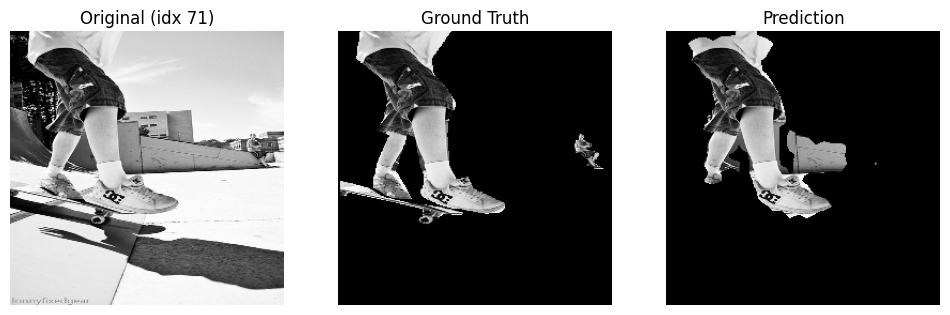

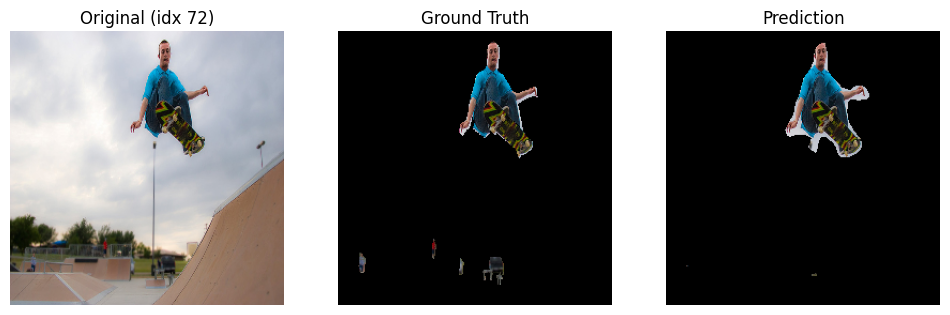

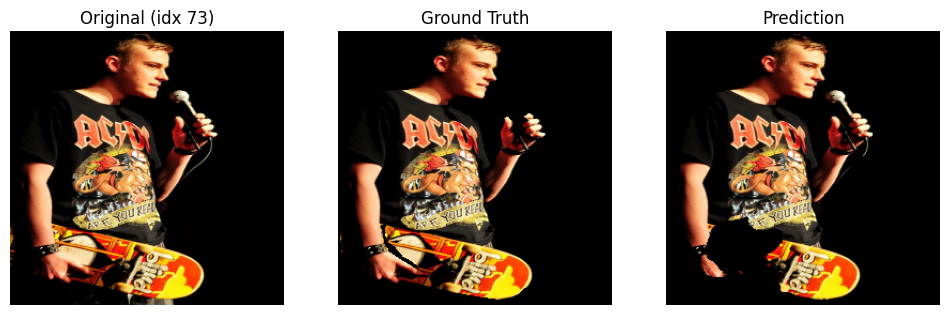

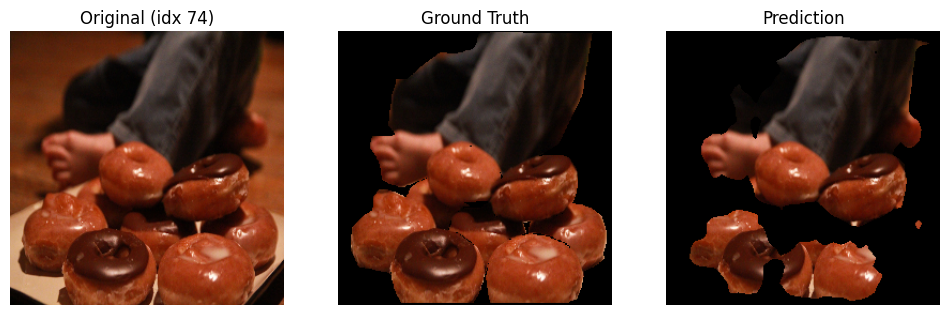

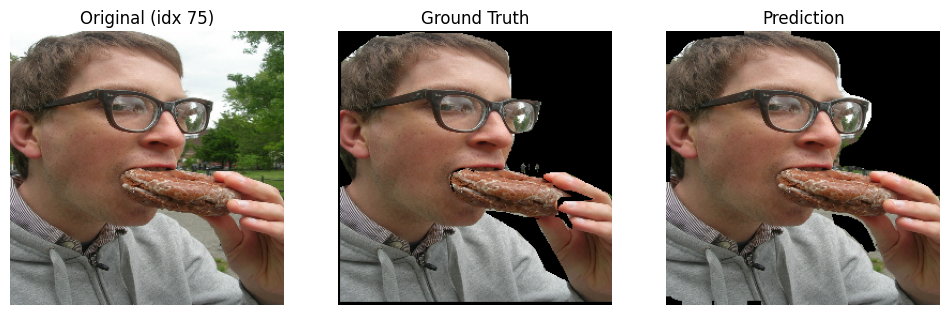

...

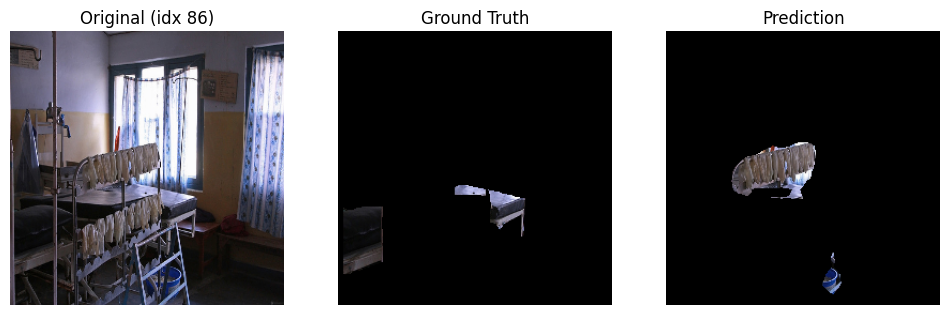

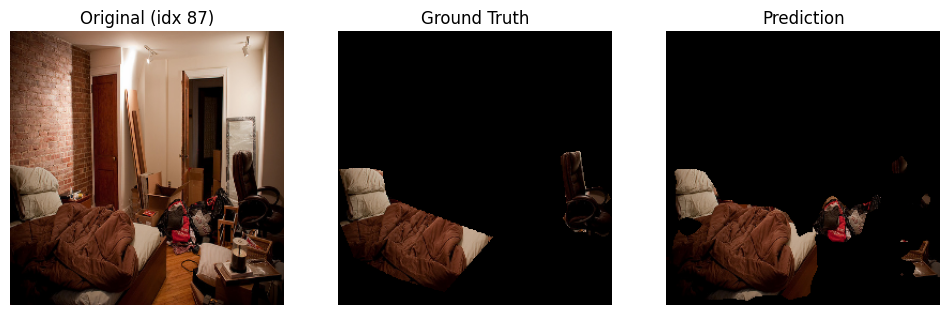

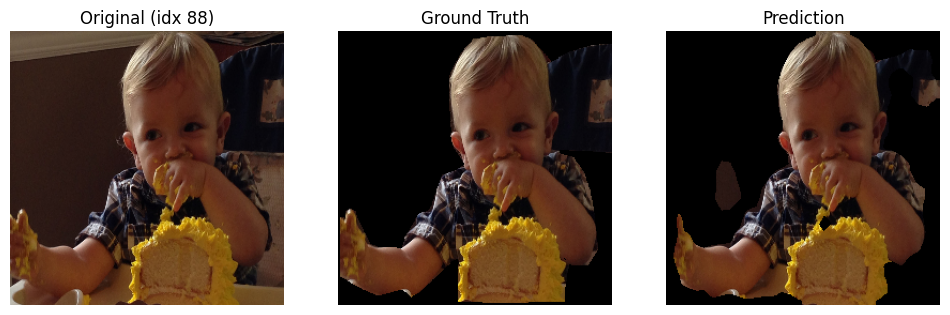

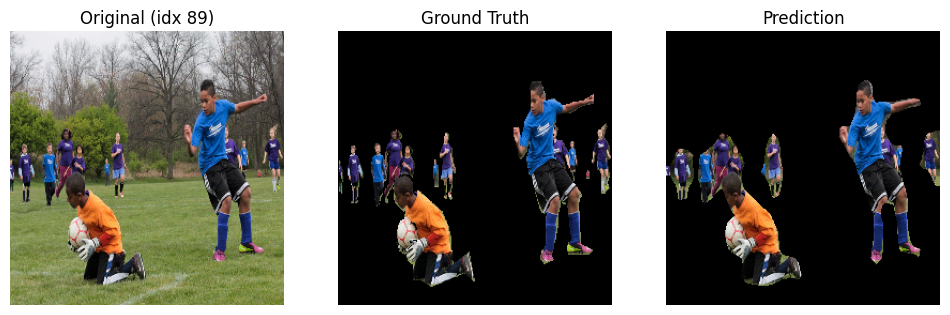

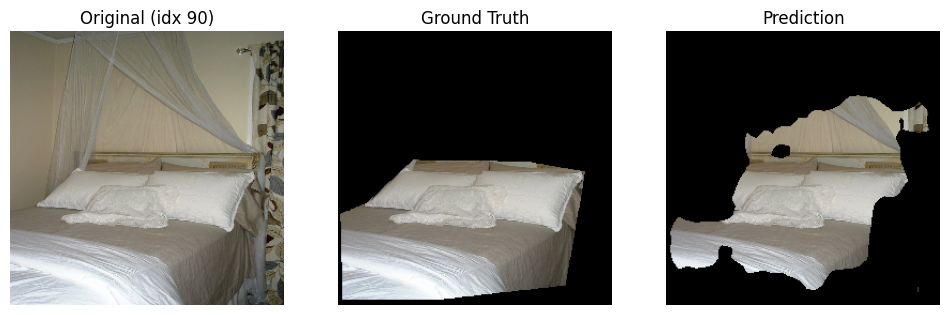

In [ ]:

# === Fine-tune classifier head only (run this cell) ===
import random
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Subset, DataLoader
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Create a small training subset (50 samples or fewer if dataset smaller)
subset_size = min(100, len(dataset))
subset_indices = random.sample(range(len(dataset)), subset_size)
train_subset = Subset(dataset, subset_indices)
train_loader = DataLoader(train_subset, batch_size=4, shuffle=True, num_workers=2)

# Freeze everything except classifier and aux_classifier
for name, param in model.named_parameters():
    if ("classifier" in name) or ("aux_classifier" in name):
        param.requires_grad = True
    else:
        param.requires_grad = False

# Optimizer only for trainable params (the classifier head)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-3)
criterion = nn.CrossEntropyLoss()

# Train head for a few epochs
num_epochs = 30
model.train()
for epoch in range(num_epochs):
    running_loss = 0.0
    loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}", leave=False)
    for images, masks in loop:
        images = images.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()
        outputs = model(images)["out"]          # [B, C, H, W]
        loss = criterion(outputs, masks.long())
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        loop.set_postfix(loss=running_loss / (loop.n + 1))

    print(f"Epoch {epoch+1}/{num_epochs}  avg_loss: {running_loss/len(train_loader):.4f}")

# Save the fine-tuned-head checkpoint
torch.save(model.state_dict(), "best_deeplabv3_finetuned.pth")
print("✅ Saved: best_deeplabv3_finetuned.pth")

# === Quick evaluation + visualization for dataset indices 20–25 ===
model.eval()
mean = np.array([0.485, 0.456, 0.406])
std  = np.array([0.229, 0.224, 0.225])

with torch.no_grad():
    for idx in range(70, 90):   # indices 19→24 == dataset samples 20→25
        img, mask = dataset[idx]
        img_input = img.unsqueeze(0).to(device)
        mask = mask.to(device)

        outputs = model(img_input)["out"]
        pred = torch.argmax(outputs, dim=1).cpu().squeeze().numpy()

        # Un-normalize for display
        img = img.permute(1,2,0).cpu().numpy()
        img = np.clip(img * std + mean, 0, 1)
        gt = mask.cpu().numpy()

        # Apply mask overlays
        gt_overlay = np.zeros_like(img)
        gt_overlay[gt == 1] = img[gt == 1]
        # Show all predicted classes except background (class 0)
        pred_overlay = np.zeros_like(img)
        pred_overlay[pred != 0] = img[pred != 0]


        # Plot side-by-side
        fig, axs = plt.subplots(1,3, figsize=(12,4))
        axs[0].imshow(img); axs[0].set_title(f"Original (idx {idx+1})"); axs[0].axis("off")
        axs[1].imshow(gt_overlay); axs[1].set_title("Ground Truth"); axs[1].axis("off")
        axs[2].imshow(pred_overlay); axs[2].set_title("Prediction"); axs[2].axis("off")
        plt.show()


WEEK-6 TESTING MODEL WITH INTERNET IMAGES

In [ ]:

from google.colab import files
uploaded = files.upload()  # choose your best_deeplabv3_finetuned.pth


Saving best_deeplabv3_finetuned.pth to best_deeplabv3_finetuned (1).pth


Saving cap.jpg to cap (5).jpg
Saving car.jpeg to car (5).jpeg
Saving dog.jpg to dog (5).jpg
Saving elephant.jpg to elephant (5).jpg
Saving man-posing-with-crossed-arms.jpg to man-posing-with-crossed-arms (5).jpg
Saving nature.jpg to nature (5).jpg
Saving penguin.jpg to penguin (5).jpg
Saving rose.jpg to rose (5).jpg
Saving wall.jpg to wall (5).jpg


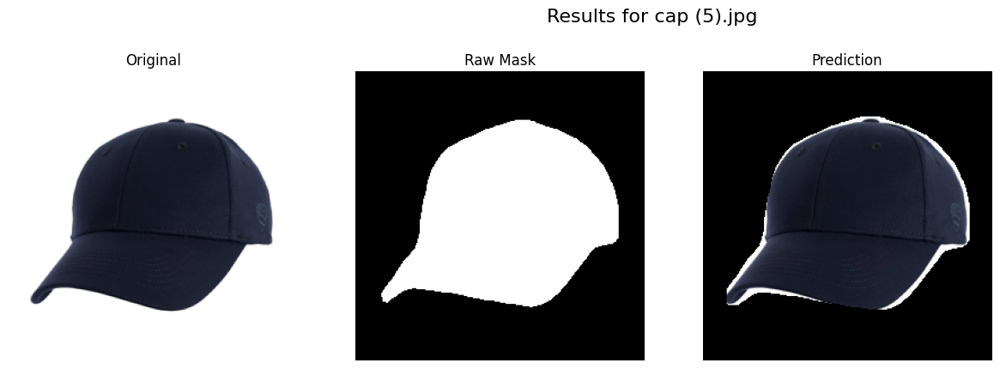

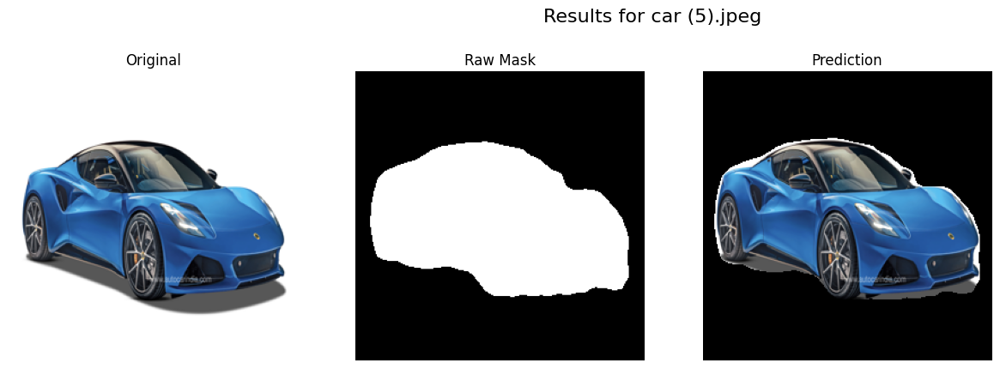

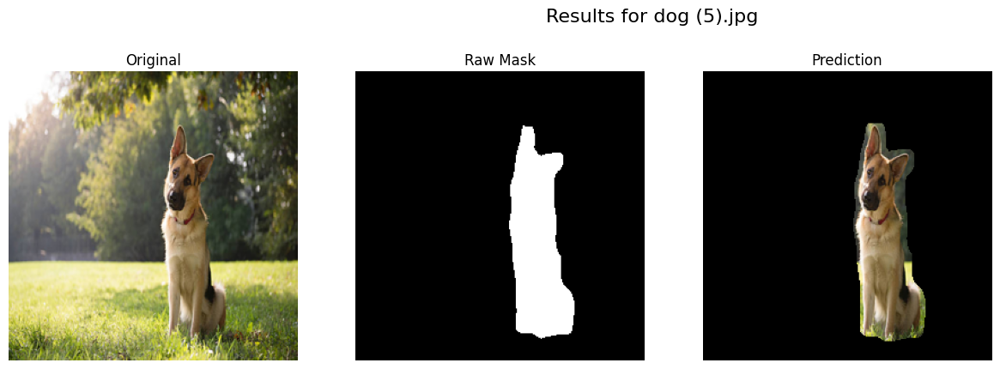

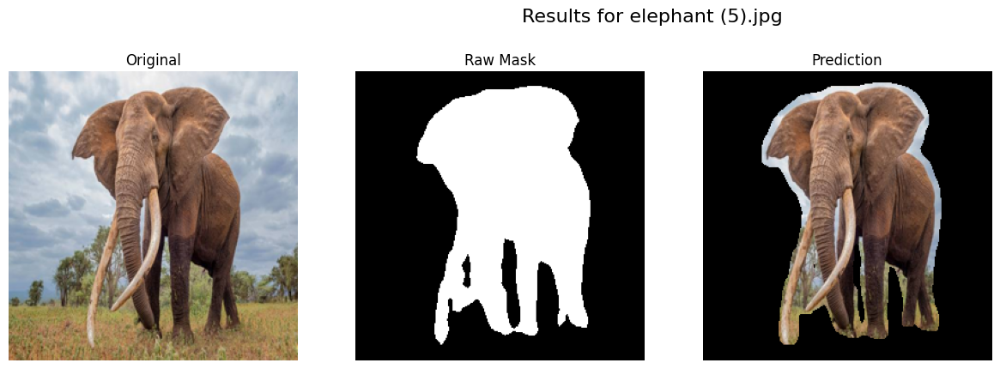

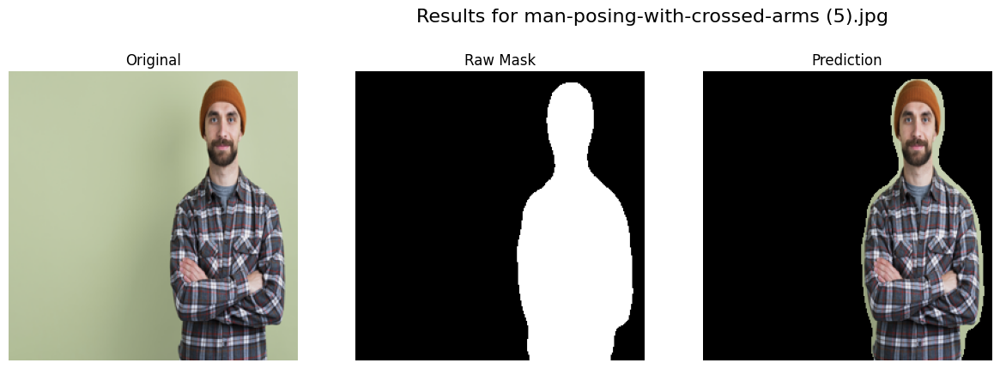

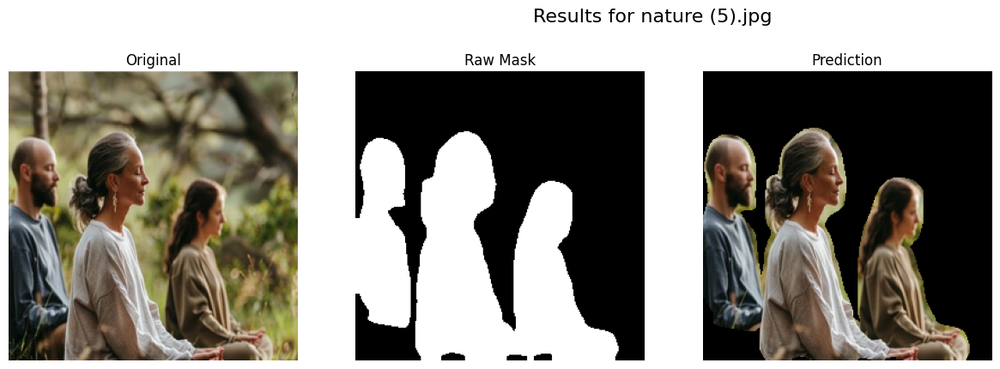

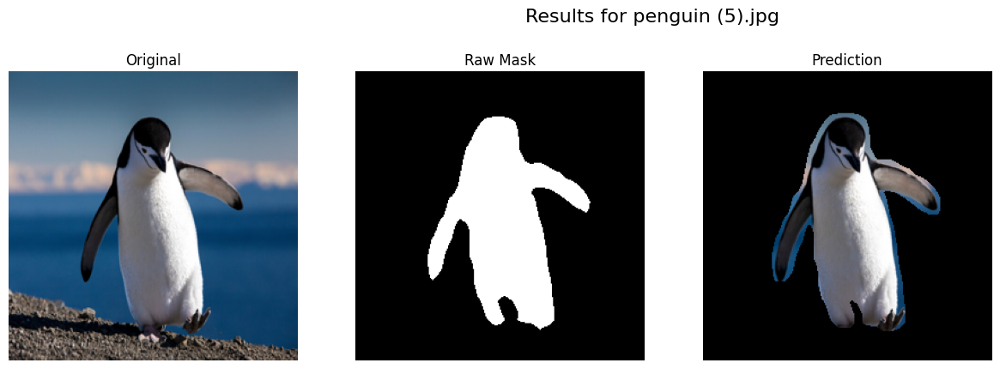

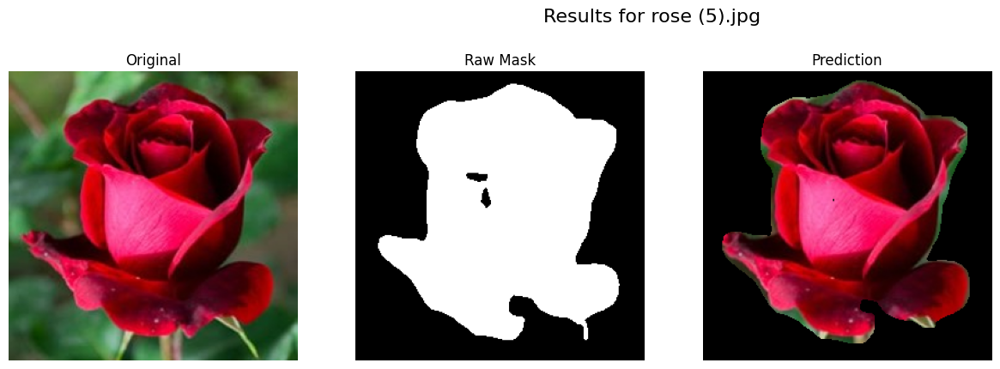

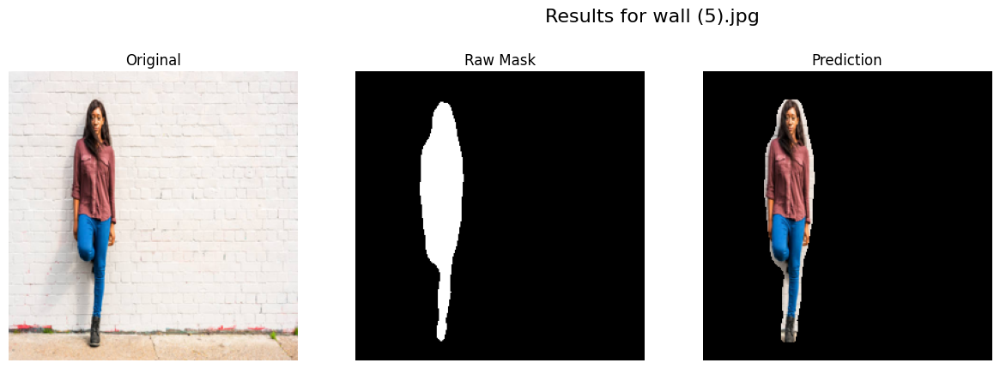

In [ ]:
import torch
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms as T
from torchvision.models.segmentation import deeplabv3_resnet50
import cv2
from google.colab import files

# -------------------------------
# 1️⃣ Upload multiple images
# -------------------------------
uploaded = files.upload()  # Select multiple images by holding CTRL/SHIFT
image_paths = list(uploaded.keys())

# -------------------------------
# 2️⃣ Load trained model
# -------------------------------
model = deeplabv3_resnet50(pretrained=False, num_classes=2)
state_dict = torch.load("/content/drive/MyDrive/AI/best_deeplabv3_finetuned.pth")
model.load_state_dict(state_dict, strict=False)
model.eval()

# -------------------------------
# 3️⃣ Preprocessing function
# -------------------------------
resize_size = (256,256)  # adjust to your training size

def preprocess_image(img):
    transform = T.Compose([
        T.ToTensor(),
        T.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])
    ])
    img_resized = img.resize(resize_size)
    return transform(img_resized).unsqueeze(0), img_resized

# -------------------------------
# 4️⃣ Mask post-processing
# -------------------------------
def clean_mask(mask):
    mask_uint8 = (mask*255).astype(np.uint8)
    kernel = np.ones((5,5), np.uint8)
    clean = cv2.morphologyEx(mask_uint8, cv2.MORPH_OPEN, kernel)
    clean = cv2.morphologyEx(clean, cv2.MORPH_CLOSE, kernel)
    clean = cv2.GaussianBlur(clean, (7,7), 0)
    return clean

# -------------------------------
# 5️⃣ Process all images
# -------------------------------
for path in image_paths:
    img = Image.open(path).convert("RGB")
    img_tensor, img_resized = preprocess_image(img)

    # Predict mask
    with torch.no_grad():
        output = model(img_tensor)['out']
        mask = torch.argmax(output.squeeze(), dim=0).cpu().numpy()

    # Clean mask
    processed_mask = clean_mask(mask)

    # Extract subject
    img_array = np.array(img_resized)
    extracted = np.zeros_like(img_array)
    extracted[processed_mask>0] = img_array[processed_mask>0]
    # -------------------------------
    # 6️⃣ Visualize results
    # -------------------------------
    plt.figure(figsize=(20,5))
    plt.suptitle(f"Results for {path}", fontsize=16)

    plt.subplot(1,4,1)
    plt.imshow(img_resized)
    plt.title("Original")
    plt.axis('off')

    plt.subplot(1,4,2)
    plt.imshow(mask, cmap='gray')
    plt.title("Raw Mask")
    plt.axis('off')

    plt.subplot(1,4,3)
    plt.imshow(extracted)
    plt.title("Prediction")
    plt.axis('off')

    plt.show()


In [3]:
import torch
import torchvision
from torchvision import models

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load pretrained DeepLabV3 with ResNet50 backbone
model = models.segmentation.deeplabv3_resnet50(pretrained=True)
model = model.to(device)
model.eval()

print("✅ Pretrained DeepLabV3 loaded successfully")


c:\Users\laksh\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\laksh\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


✅ Pretrained DeepLabV3 loaded successfully


In [4]:

from pycocotools.coco import COCO
import numpy as np
import cv2
import os

ann_file = r"C:\Users\laksh\coco_dataset\annotations\instances_val2017.json"
img_dir = r"C:\Users\laksh\coco_dataset\val2017"
mask_out_dir = r"C:\Users\laksh\coco_dataset\val2017_masks"
os.makedirs(mask_out_dir, exist_ok=True)

coco = COCO(ann_file)


for img_id in coco.getImgIds():
    img_info = coco.loadImgs(img_id)[0]
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)

    mask = np.zeros((img_info["height"], img_info["width"]), dtype=np.uint8)

    for ann in anns:
        cls_id = ann["category_id"]
        rle = coco.annToRLE(ann)
        m = coco.annToMask(ann) * cls_id
        mask = np.maximum(mask, m)

    mask_path = os.path.join(mask_out_dir, f"{img_info['file_name'].split('.')[0]}.png")
    cv2.imwrite(mask_path, mask)


loading annotations into memory...
Done (t=0.58s)
creating index...
index created!


In [ ]:
import torch
import numpy as np
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import os
import torchvision.transforms as T

# ================================
# Dataset Class for Segmentation
# ================================
class SegmentationDataset(Dataset):
    def __init__(self, images_dir, masks_dir, transform=None, target_size=(256, 256)):
        self.images = sorted(os.listdir(images_dir))
        self.masks = sorted(os.listdir(masks_dir))
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.transform = transform
        self.target_size = target_size

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.images_dir, self.images[idx])
        mask_path = os.path.join(self.masks_dir, self.masks[idx])

        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path)

        # Resize both image and mask to same size
        image = image.resize(self.target_size, Image.BILINEAR)
        mask = mask.resize(self.target_size, Image.NEAREST)  # NEAREST for labels!

        if self.transform:
            image = self.transform(image)

        mask = torch.tensor(np.array(mask), dtype=torch.long)

        return image, mask

# ================================
# Paths (update these!)
# ================================
img_dir = r"C:\Users\laksh\coco_dataset\val2017"
mask_dir = r"C:\Users\laksh\coco_dataset\val2017_masks"   # generated masks folder

transform = T.Compose([
    T.Resize((256, 256)),
    T.ToTensor(),
])

val_dataset = SegmentationDataset(img_dir, mask_dir, transform=transform)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False)

# ================================
# Evaluation Function
# ================================
def evaluate_model(model, dataloader, device, num_classes=2):
    model.eval()
    iou_list = []
    dice_list = []
    total_correct = 0
    total_pixels = 0

    with torch.no_grad():
        for images, masks in tqdm(dataloader, desc="Evaluating"):
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)["out"]
            preds = torch.argmax(outputs, dim=1)

            for pred, mask in zip(preds, masks):
                pred = pred.cpu().numpy()
                mask = mask.cpu().numpy()

                for cls in range(1, num_classes):  # skip background
                    pred_cls = (pred == cls).astype(np.uint8)
                    mask_cls = (mask == cls).astype(np.uint8)

                    intersection = np.logical_and(pred_cls, mask_cls).sum()
                    union = np.logical_or(pred_cls, mask_cls).sum()
                    dice = (2 * intersection) / (pred_cls.sum() + mask_cls.sum() + 1e-6)

                    if union > 0:
                        iou_list.append(intersection / union)
                    dice_list.append(dice)

                total_correct += (pred == mask).sum()
                total_pixels += mask.size

    mean_iou = np.mean(iou_list) if iou_list else 0
    mean_dice = np.mean(dice_list) if dice_list else 0
    pixel_acc = total_correct / total_pixels

    return mean_iou, mean_dice, pixel_acc

# ================================
# Run Evaluation
# ================================
mean_iou, mean_dice, pixel_acc = evaluate_model(model, val_loader, device, num_classes=2)

print(f"✅ Evaluation Results:")
print(f"Mean IoU:   {mean_iou:.4f}")
print(f"Mean Dice:  {mean_dice:.4f}")
print(f"Pixel Acc:  {pixel_acc:.4f}")

Evaluating: 100%|██████████| 1250/1250 [39:57<00:00,  1.92s/it]

✅ Evaluation Results:
Mean IoU: 0.574
Mean Dice: 0.6859
Pixel Acc: 0.8711


In [ ]:
import torch
import numpy as np
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import os
import torchvision.transforms as T

# ================================
# Dataset Class for Segmentation
# ================================
class SegmentationDataset(Dataset):
    def __init__(self, images_dir, masks_dir, transform=None, target_size=(256, 256)):
        self.images = sorted(os.listdir(images_dir))
        self.masks = sorted(os.listdir(masks_dir))
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.transform = transform
        self.target_size = target_size

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.images_dir, self.images[idx])
        mask_path = os.path.join(self.masks_dir, self.masks[idx])

        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path)

        # Resize both image and mask to same size
        image = image.resize(self.target_size, Image.BILINEAR)
        mask = mask.resize(self.target_size, Image.NEAREST)  # NEAREST for labels!

        if self.transform:
            image = self.transform(image)

        mask = torch.tensor(np.array(mask), dtype=torch.long)

        return image, mask

# ================================
# Paths (update these!)
# ================================
img_dir = r"C:\Users\laksh\coco_dataset\val2017"
mask_dir = r"C:\Users\laksh\coco_dataset\val2017_masks"   # generated masks folder

transform = T.Compose([
    T.Resize((256, 256)),
    T.ToTensor(),
])

val_dataset = SegmentationDataset(img_dir, mask_dir, transform=transform)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False)

# ================================
# Evaluation Function
# ================================
def evaluate_model(model, dataloader, device, num_classes=2):
    model.eval()
    iou_list = []
    dice_list = []
    total_correct = 0
    total_pixels = 0

    with torch.no_grad():
        for images, masks in tqdm(dataloader, desc="Evaluating"):
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)["out"]
            preds = torch.argmax(outputs, dim=1)

            for pred, mask in zip(preds, masks):
                pred = pred.cpu().numpy()
                mask = mask.cpu().numpy()

                for cls in range(1, num_classes):  # skip background
                    pred_cls = (pred == cls).astype(np.uint8)
                    mask_cls = (mask == cls).astype(np.uint8)

                    intersection = np.logical_and(pred_cls, mask_cls).sum()
                    union = np.logical_or(pred_cls, mask_cls).sum()
                    dice = (2 * intersection) / (pred_cls.sum() + mask_cls.sum() + 1e-6)

                    if union > 0:
                        iou_list.append(intersection / union)
                    dice_list.append(dice)

                total_correct += (pred == mask).sum()
                total_pixels += mask.size

    mean_iou = np.mean(iou_list) if iou_list else 0
    mean_dice = np.mean(dice_list) if dice_list else 0
    pixel_acc = total_correct / total_pixels

    return mean_iou, mean_dice, pixel_acc

# ================================
# Run Evaluation
# ================================
mean_iou, mean_dice, pixel_acc = evaluate_model(model, val_loader, device, num_classes=2)

print(f"✅ Evaluation Results:")
print(f"Mean IoU:   {mean_iou:.4f}")
print(f"Mean Dice:  {mean_dice:.4f}")
print(f"Pixel Acc:  {pixel_acc:.4f}")

Evaluating: 100%|██████████| 1250/1250 [41:21<00:00,  1.98s/it]

✅ Evaluation Results:
Mean IoU:  0.7814
Mean Dice: 0.8774
Pixel Acc: 0.9311
